### Problem Statement:
Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate
market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market
and there are various companies working in the domain. Data science comes as a very important tool to solve problems
in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and
focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling,
recommendation systems are some of the machine learning techniques used for achieving the business goals for housing
companies. Our problem is related to one such housing company.
A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses
data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same
purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file
below.
The company is looking at prospective properties to buy houses to enter the market. You are required to build a model
using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest
in them or not. For this company wants to know:
• Which variables are important to predict the price of variable?
• How do these variables describe the price of the house?

### Business Goal:

You are required to model the price of houses with the available independent variables. This model will then be used
by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the
strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the
management to understand the pricing dynamics of a new market.

### Technical Requirements:

Data contains 1460 entries each having 81 variables.

• Data contains Null values. You need to treat them using the domain knowledge and your own understanding.

• Extensive EDA has to be performed to gain relationships of important variable and price.

• Data contains numerical as well as categorical variable. You need to handle them accordingly.

• You have to build Machine Learning models, apply regularization and determine the optimal values of Hyper
Parameters.

• You need to find important features which affect the price positively or negatively.
• Two datasets are being provided to you (test.csv, train.csv). You will train on train.csv dataset and predict on
test.csv file.


In [1]:
 from pickle import Unpickler as Upck
import pandas as pd
import klib
import sweetviz
import numpy as np
import matplotlib.pyplot as plt
import time
import seaborn as sns

### Let’s load the Kaggle dataset into a Pandas data frame:

In [2]:
df_train = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/FlipRobo/train.csv')
df_test = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/FlipRobo/test.csv')
y = df_train[['SalePrice']]
idx_test = df_test[['Id']]

In [3]:
# Visualisation train
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,...,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,...,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,...,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,...,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,...,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,...,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


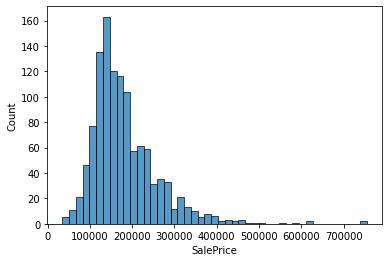

In [4]:
sns.histplot(df_train['SalePrice'])

### Most of the density lies between 100k and 250k, but there appears to be a lot of outliers on the pricier side.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


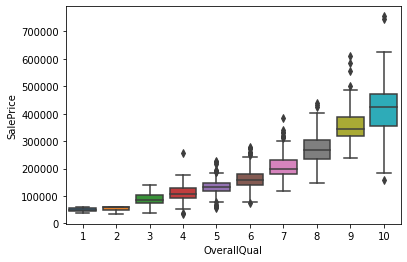

In [5]:
sns.boxplot(df_train['OverallQual'],df_train['SalePrice'])

### Everything seems fine for this one, except that when you look to the right things start getting much more nuanced. Will that “confuse” our model?

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


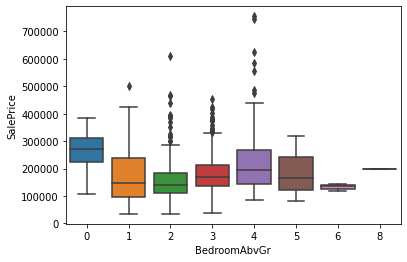

In [6]:
sns.boxplot(df_train['BedroomAbvGr'],df_train['SalePrice'])

## Analysing a single dataframe (and its optional target feature)

In [7]:
my_report=sweetviz.analyze([df_train,"Train"],target_feat='SalePrice')

                                             |          | [  0%]   00:00 -> (? left)


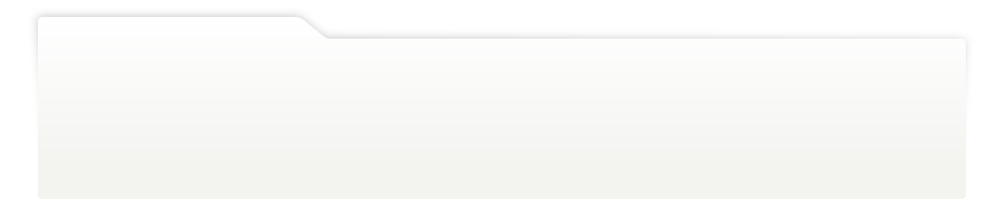
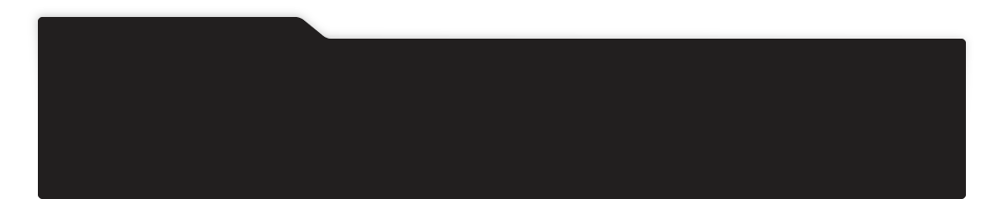
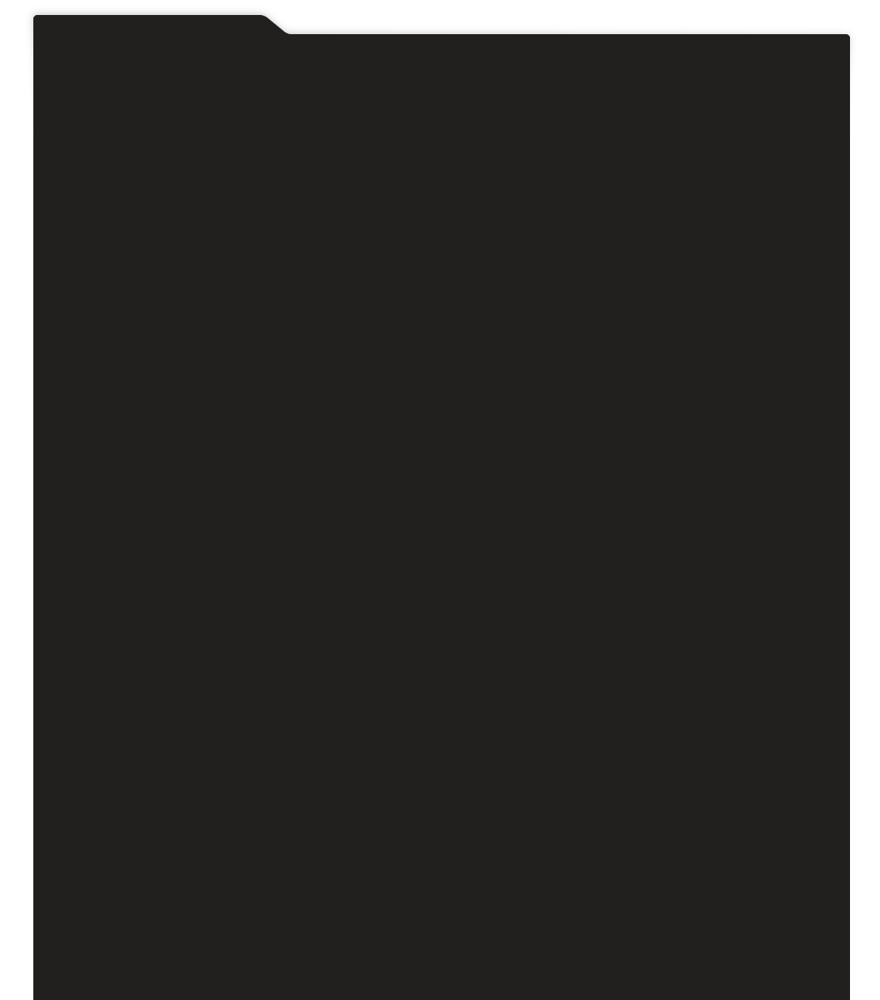
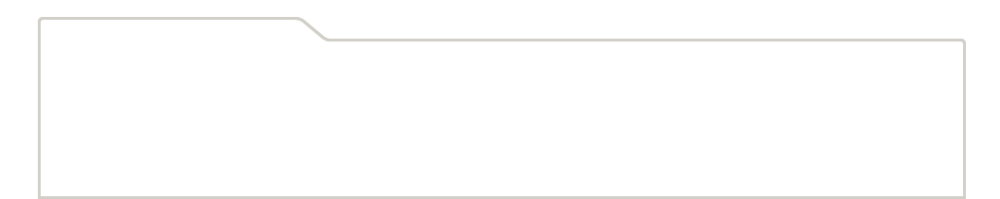
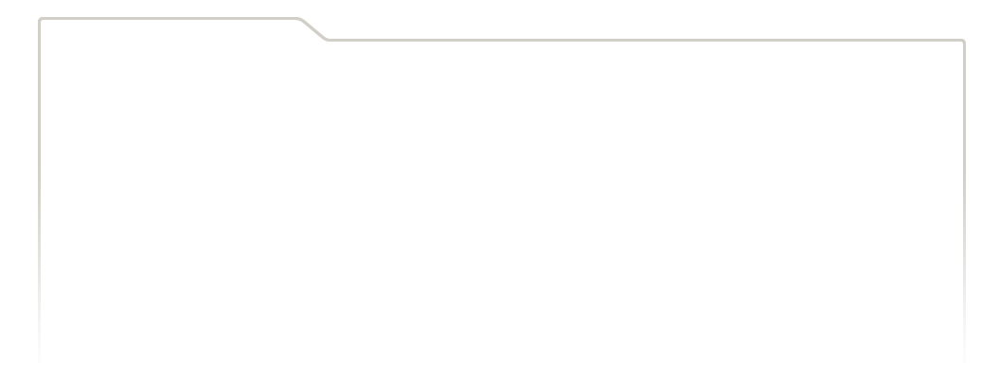
...
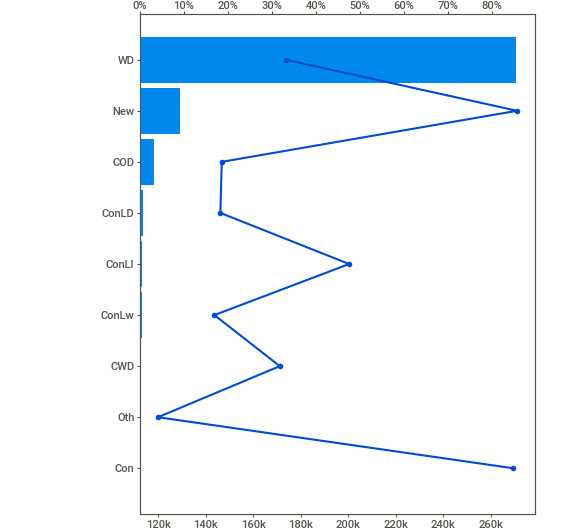
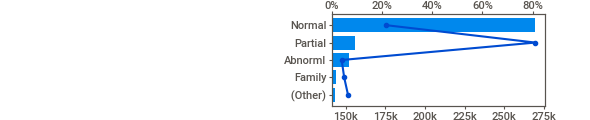
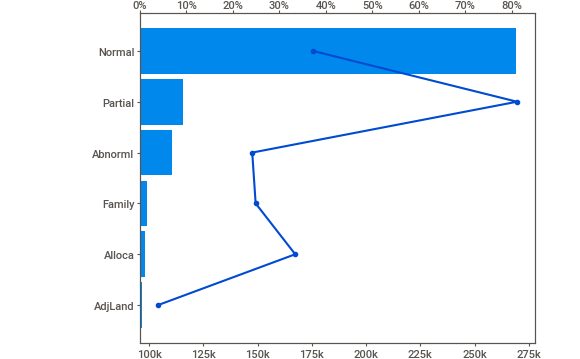
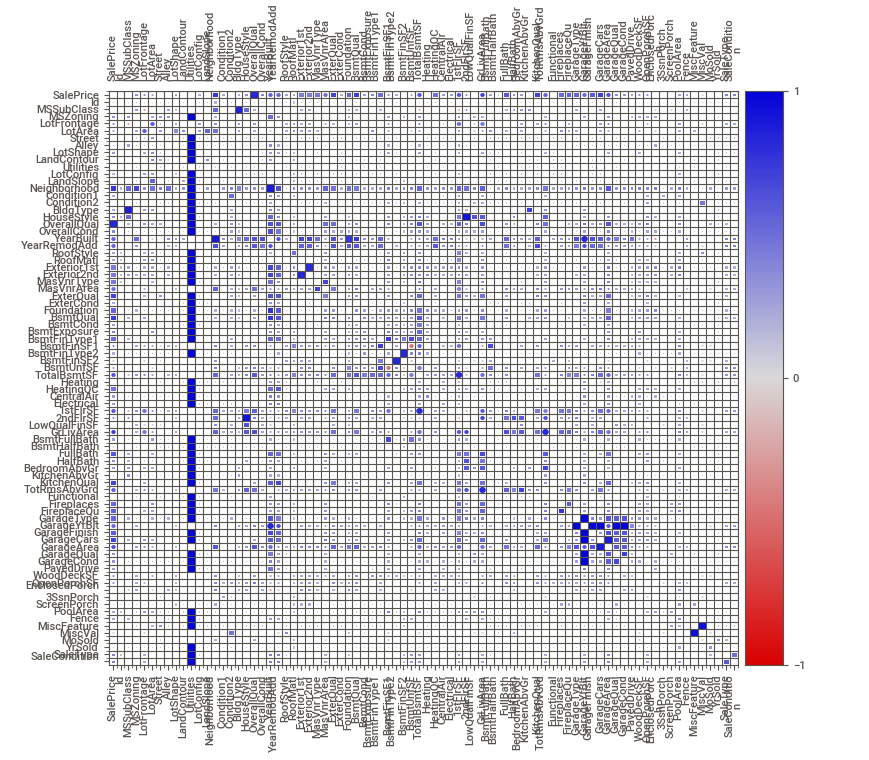
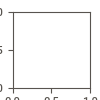

In [8]:
my_report.show_notebook()

In [9]:
  # Visualisation train
df_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


###Compaire two dataframe (eg. Test vs Train data set)

In [10]:
my_report1=sweetviz.compare([df_train,"Train"],[df_test,"Test"],target_feat='SalePrice')

                                             |          | [  0%]   00:00 -> (? left)


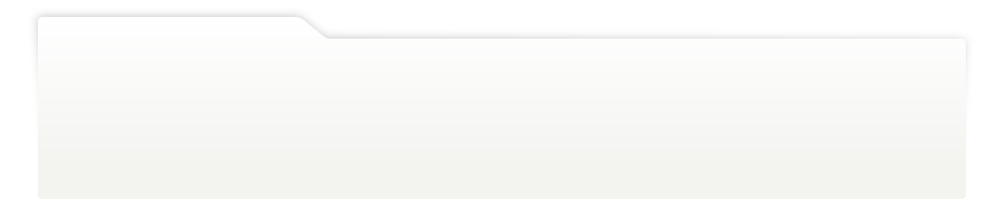
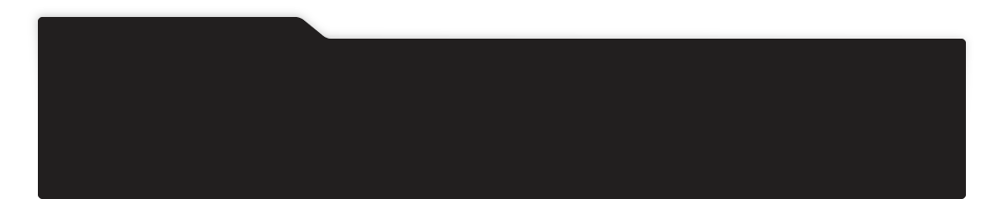
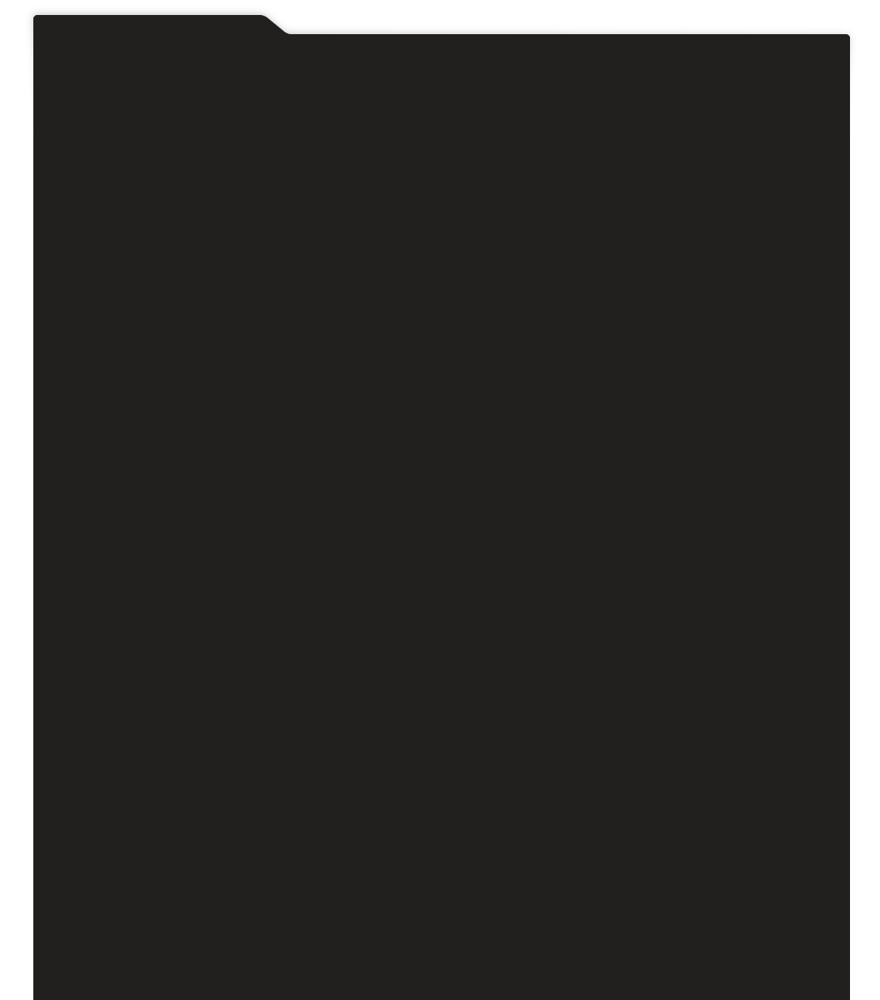
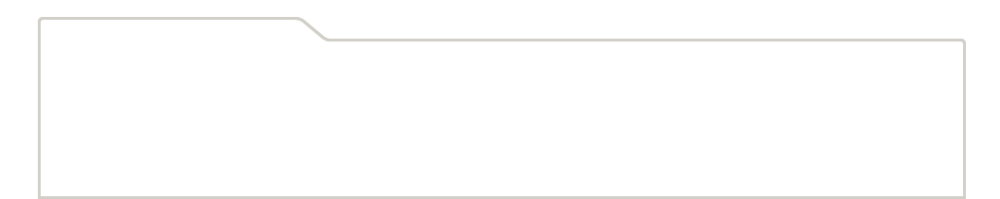
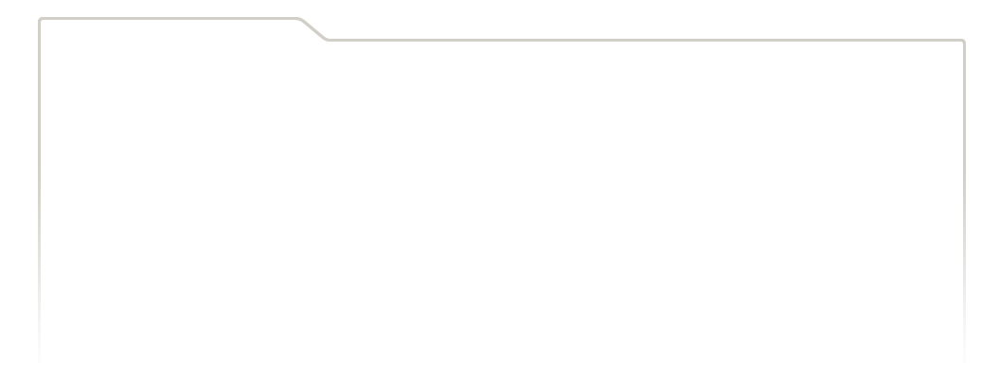
...
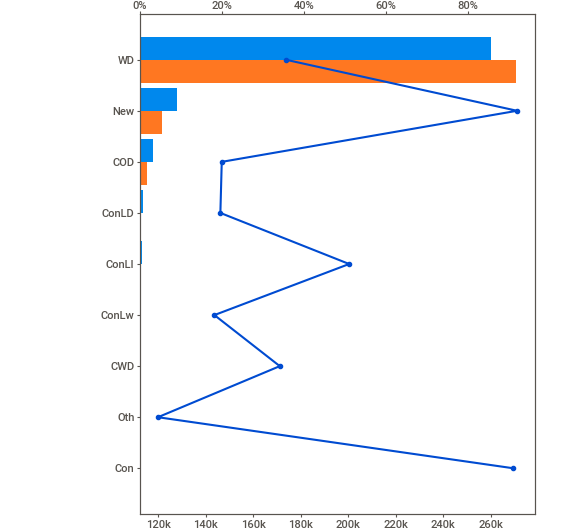
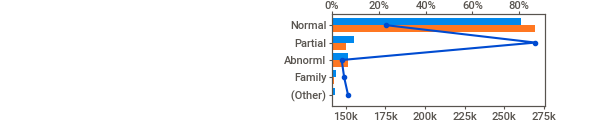
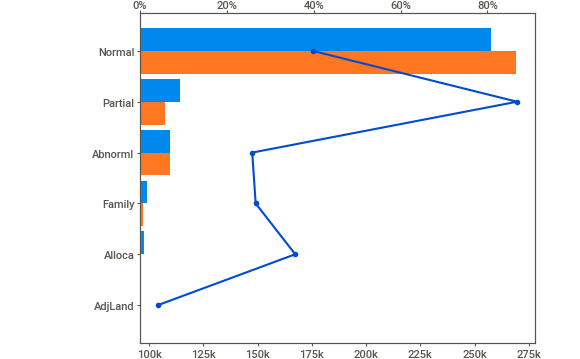
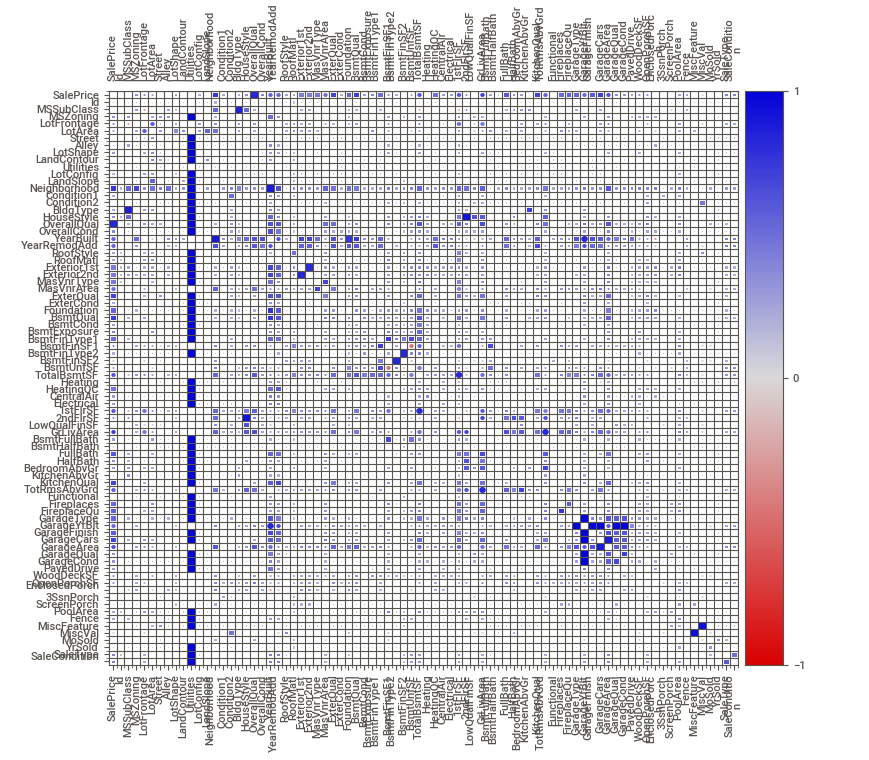
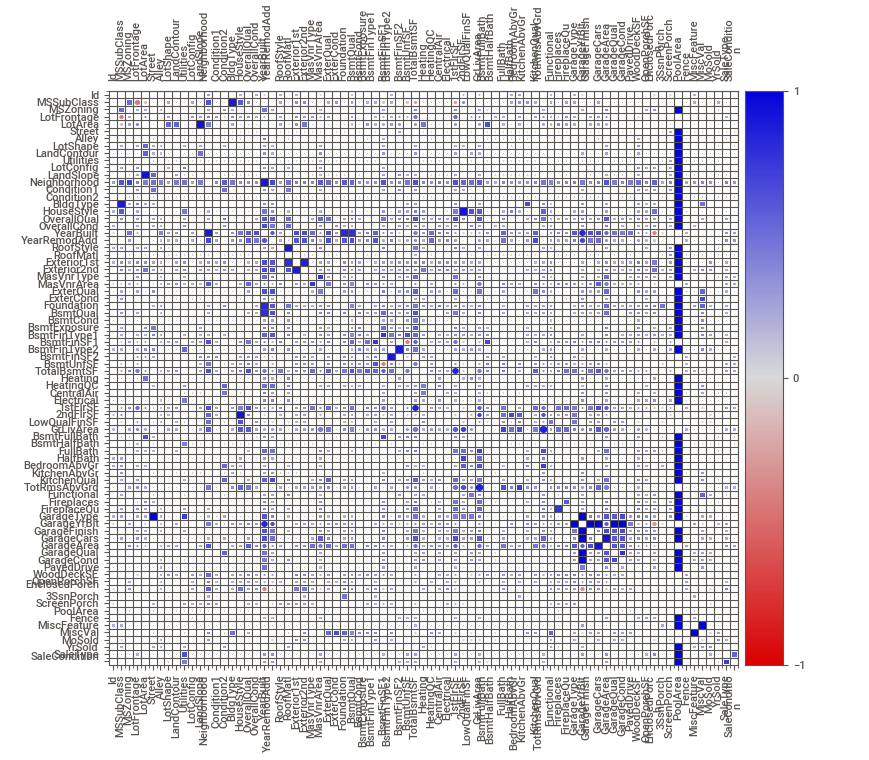

In [11]:
my_report1.show_notebook()

In [12]:
print('df_train: ', df_train.shape)
print('df_test: ', df_test.shape)

df_train:  (1168, 81)
df_test:  (292, 80)


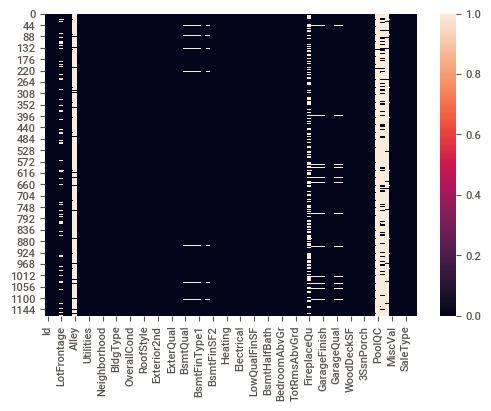

In [13]:
sns.heatmap(df_train.isnull())

In [14]:
df_train.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice          int64
Length: 81, dtype: object

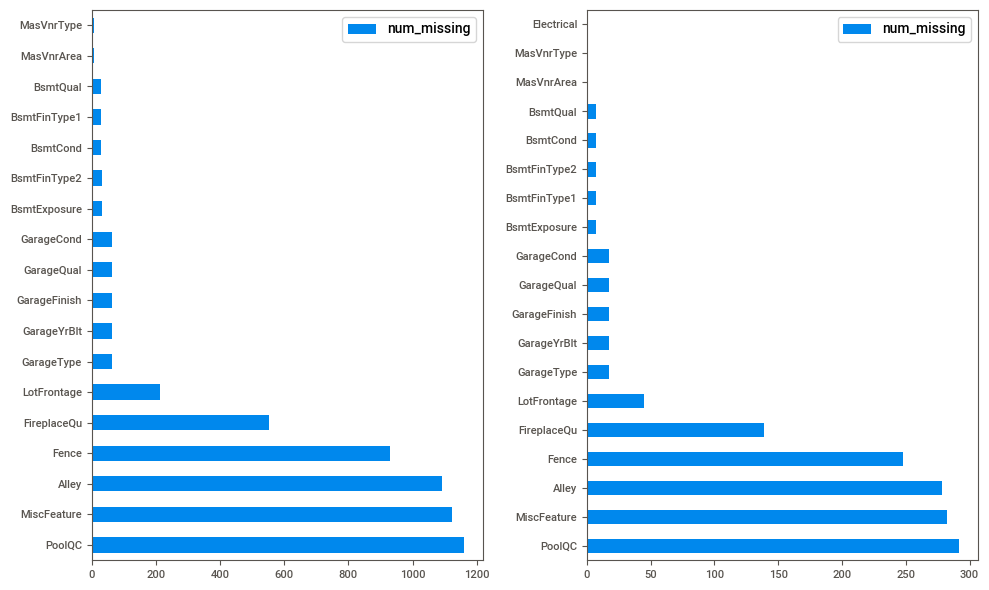

In [15]:
# Check for missing values in train & test sets.
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2)
df_train.isnull().sum().to_frame(name='num_missing').query('num_missing>0').sort_values(by='num_missing', ascending=False).plot.barh(ax=ax1, figsize=(10,6));
df_test.isnull().sum().to_frame(name='num_missing').query('num_missing>0').sort_values(by='num_missing', ascending=False).plot.barh(ax=ax2, figsize=(10,6));
plt.tight_layout()

In [16]:
# pivot table for the missing values
total = df_train.isnull().sum().sort_values(ascending=False)
percentage = (df_train.isnull().sum()/df_train.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percentage], axis=1, keys=['Total', 'Percentage'])
missing_data.head(20)

,Total,Percentage
PoolQC,1161,0.994007
MiscFeature,1124,0.962329
Alley,1091,0.934075
Fence,931,0.797089
FireplaceQu,551,0.471747
LotFrontage,214,0.183219
GarageType,64,0.054795
GarageCond,64,0.054795
GarageYrBlt,64,0.054795
GarageFinish,64,0.054795


In [17]:
#select numeric columns 
train_data_numeric=df_train.select_dtypes(include=[np.number])
numeric_cols=train_data_numeric.columns.values
print(numeric_cols)
print(len(numeric_cols))

['Id' 'MSSubClass' 'LotFrontage' 'LotArea' 'OverallQual' 'OverallCond'
 'YearBuilt' 'YearRemodAdd' 'MasVnrArea' 'BsmtFinSF1' 'BsmtFinSF2'
 'BsmtUnfSF' 'TotalBsmtSF' '1stFlrSF' '2ndFlrSF' 'LowQualFinSF'
 'GrLivArea' 'BsmtFullBath' 'BsmtHalfBath' 'FullBath' 'HalfBath'
 'BedroomAbvGr' 'KitchenAbvGr' 'TotRmsAbvGrd' 'Fireplaces' 'GarageYrBlt'
 'GarageCars' 'GarageArea' 'WoodDeckSF' 'OpenPorchSF' 'EnclosedPorch'
 '3SsnPorch' 'ScreenPorch' 'PoolArea' 'MiscVal' 'MoSold' 'YrSold'
 'SalePrice']
38


In [18]:
#select non numeric columns
train_data_non_numeric = df_train.select_dtypes(exclude=[np.number])
non_numeric_cols=train_data_non_numeric.columns.values
print(non_numeric_cols)
print(len(non_numeric_cols))

['MSZoning' 'Street' 'Alley' 'LotShape' 'LandContour' 'Utilities'
 'LotConfig' 'LandSlope' 'Neighborhood' 'Condition1' 'Condition2'
 'BldgType' 'HouseStyle' 'RoofStyle' 'RoofMatl' 'Exterior1st'
 'Exterior2nd' 'MasVnrType' 'ExterQual' 'ExterCond' 'Foundation'
 'BsmtQual' 'BsmtCond' 'BsmtExposure' 'BsmtFinType1' 'BsmtFinType2'
 'Heating' 'HeatingQC' 'CentralAir' 'Electrical' 'KitchenQual'
 'Functional' 'FireplaceQu' 'GarageType' 'GarageFinish' 'GarageQual'
 'GarageCond' 'PavedDrive' 'PoolQC' 'Fence' 'MiscFeature' 'SaleType'
 'SaleCondition']
43


In [19]:
# values.count() per feature
# we can see that many feature contains almost times the same value
# this kind of feature is useless for any model
count=0
for col in df_train:
    if df_train[col].dtypes == 'object':
      print(df_train[col].value_counts(), '\n')
      count=count+1
      print(count)

RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64 

1
Pave    1164
Grvl       4
Name: Street, dtype: int64 

2
Grvl    41
Pave    36
Name: Alley, dtype: int64 

3
Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64 

4
Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64 

5
AllPub    1168
Name: Utilities, dtype: int64 

6
Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64 

7
Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64 

8
NAmes      182
CollgCr    118
OldTown     86
Edwards     83
Somerst     68
Gilbert     64
NridgHt     61
Sawyer      60
NWAmes      59
SawyerW     51
BrkSide     50
Crawfor     45
NoRidge     35
Mitchel     34
IDOTRR      30
ClearCr     24
Timber      24
SWISU       21
StoneBr     19
Blmngtn     15
BrDale      11
Veenker      9
MeadowV      9
NPkVill      8
Blueste      2
Name: Neighborhood,

In [20]:
df_raw = pd.concat([df_train, df_test])

In [21]:
df_raw

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,...,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,...,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000.0
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,...,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000.0
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,...,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790.0
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,...,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000.0
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,...,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,83,20,RL,78.0,10206,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,468.0,TA,TA,PConc,Gd,TA,No,GLQ,33,Unf,0,1530,1563,GasA,...,Y,SBrkr,1563,0,0,1563,0,0,2,0,3,1,Gd,6,Typ,1,Gd,Attchd,2007.0,RFn,3,758,TA,TA,Y,144,99,0,0,0,0,NaN,NaN,NaN,0,10,2008,WD,Normal,NaN
288,1048,20,RL,57.0,9245,Pave,NaN,IR2,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,5,5,1994,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,686,Unf,0,304,990,GasA,...,Y,SBrkr,990,0,0,990,0,1,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1996.0,Unf,2,672,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,NaN
289,17,20,RL,NaN,11241,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,7,1970,1970,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,TA,TA,No,ALQ,578,Unf,0,426,1004,GasA,...,Y,SBrkr,1004,0,0,1004,1,0,1,0,2,1,TA,5,Typ,1,TA,Attchd,1970.0,Fin,2,480,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,Shed,700,3,2010,WD,Normal,NaN
290,523,50,RM,50.0,5000,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Feedr,Norm,1Fam,1.5Fin,6,7,1947,1950,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,Gd,CBlock,TA,TA,No,ALQ,399,Unf,0,605,1004

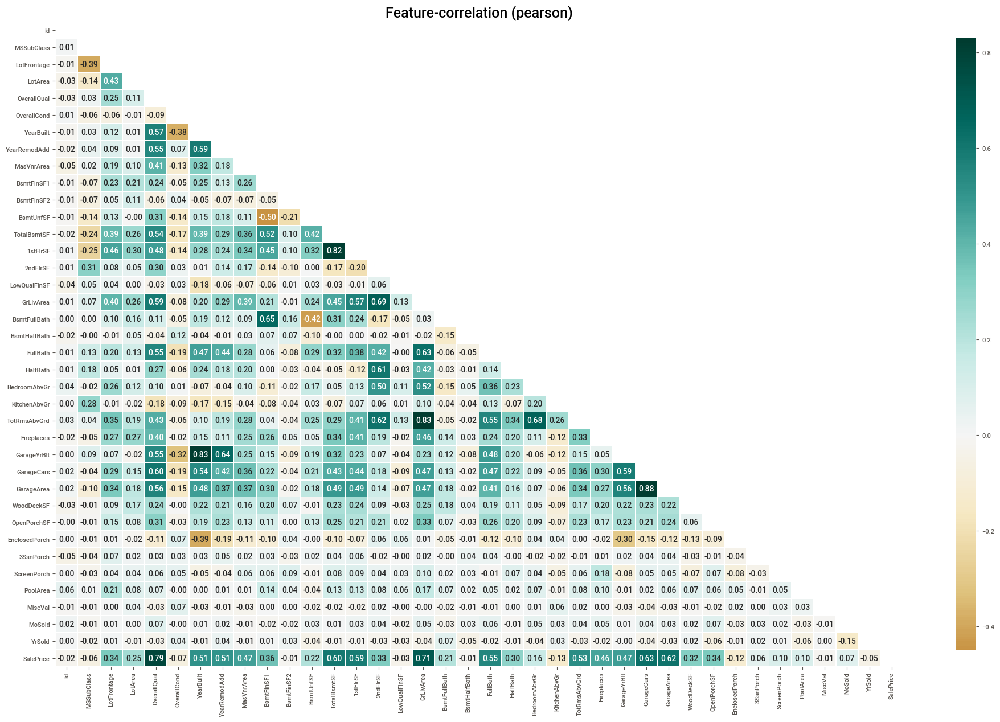

In [22]:
klib.corr_plot(df_raw,figsize=(24,15))

Note: The number of non binary numerical features is very large (32), please consider splitting the data. Showing plots for the first 20 numerical features. Override this by setting showall=True.


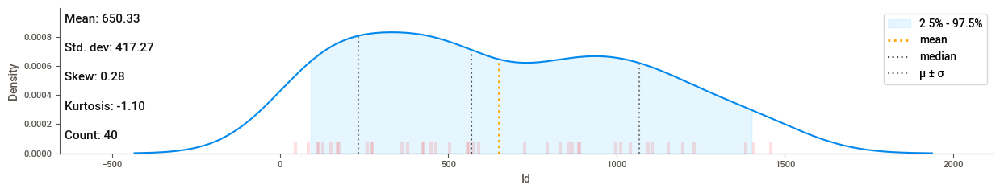

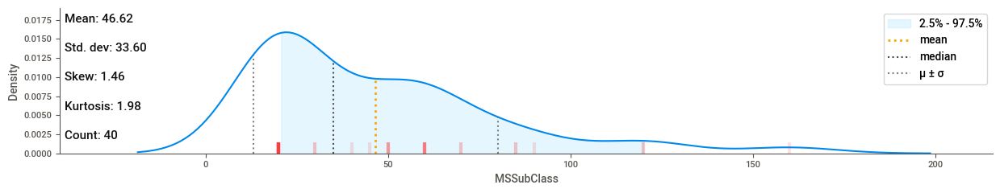

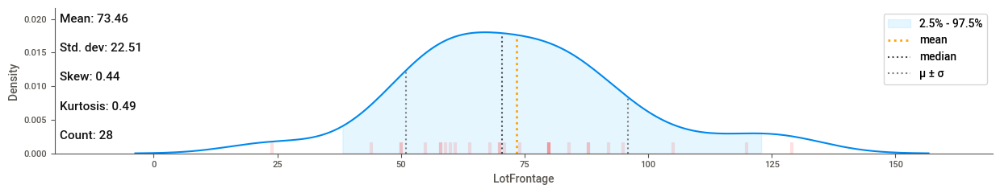

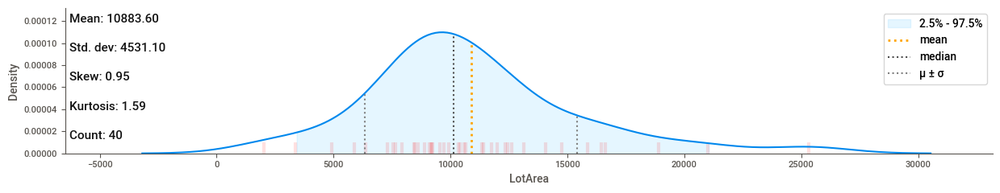

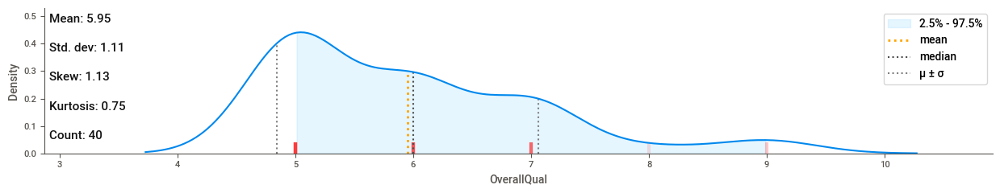

...

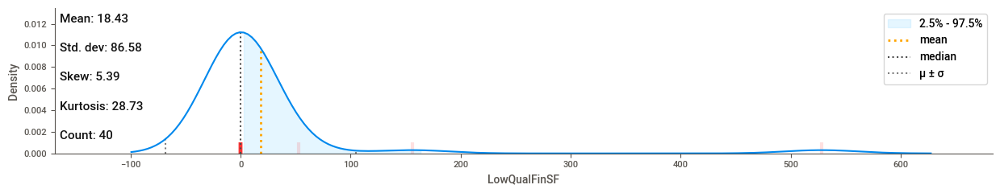

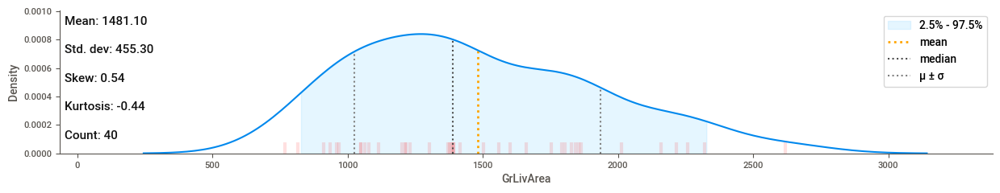

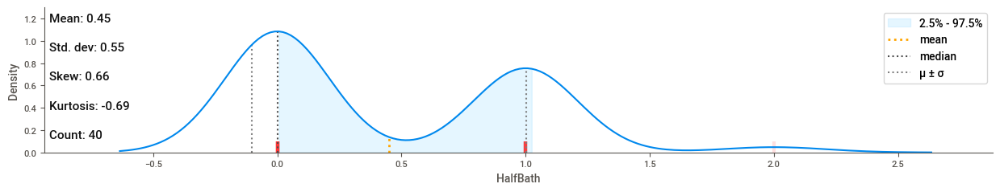

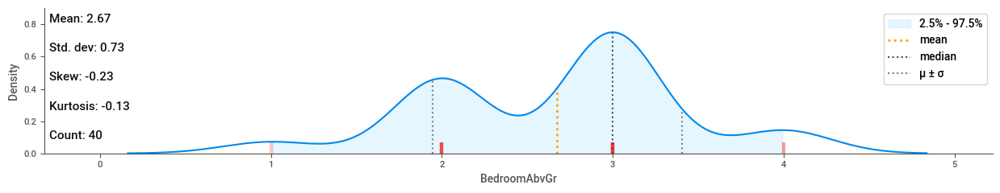

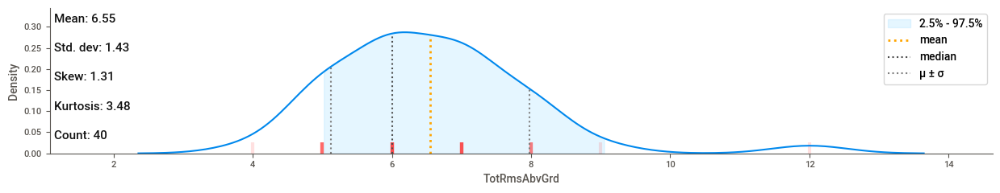

In [23]:
klib.dist_plot(df_raw[0:40])

Note: The number of non binary numerical features is very large (33), please consider splitting the data. Showing plots for the first 20 numerical features. Override this by setting showall=True.


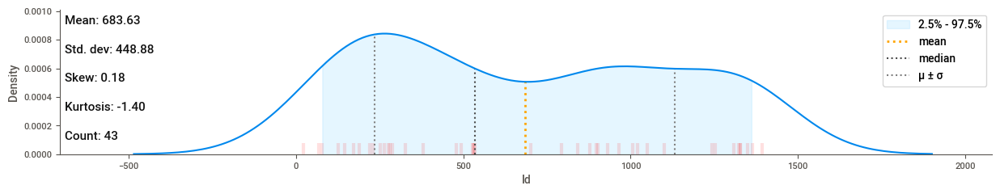

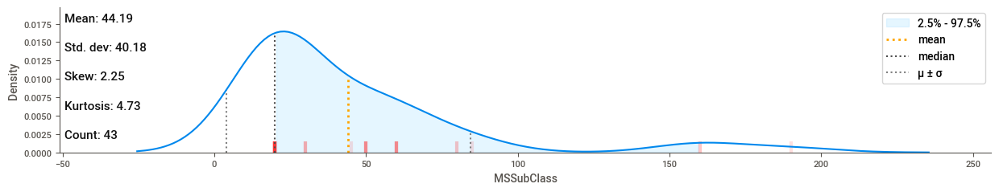

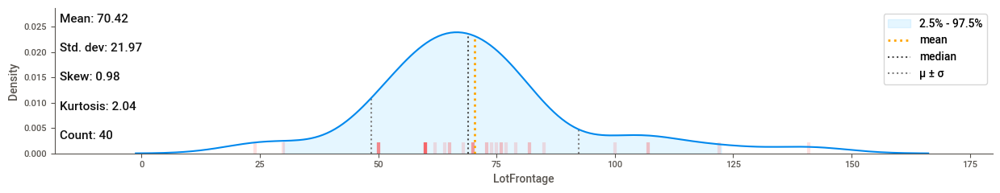

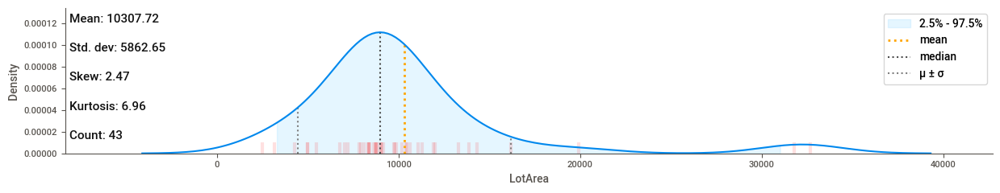

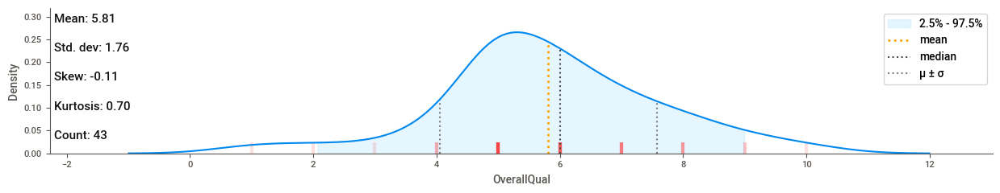

...

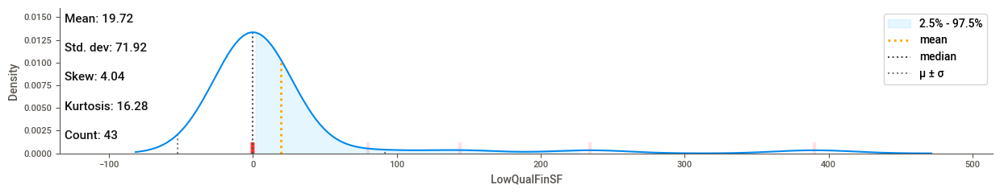

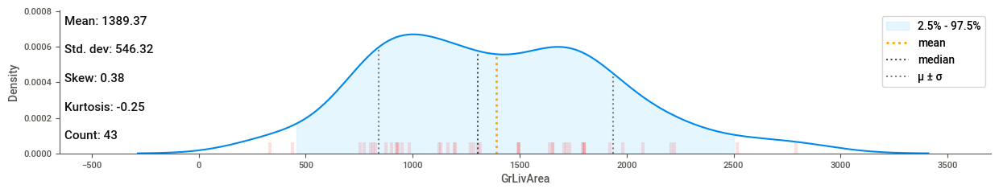

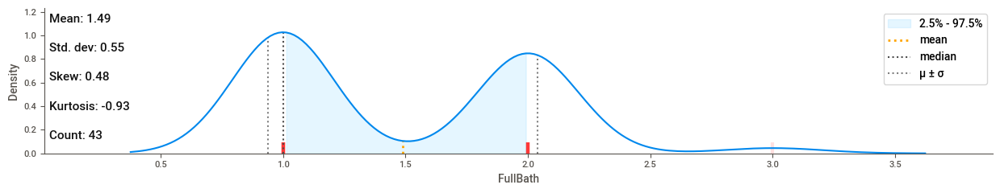

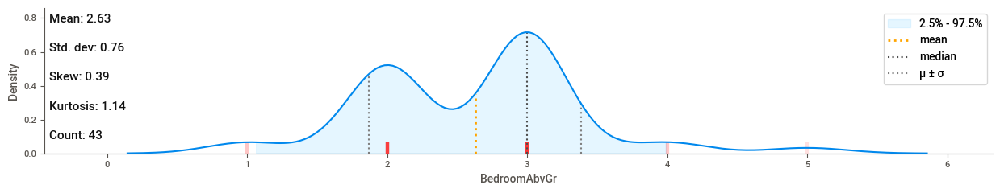

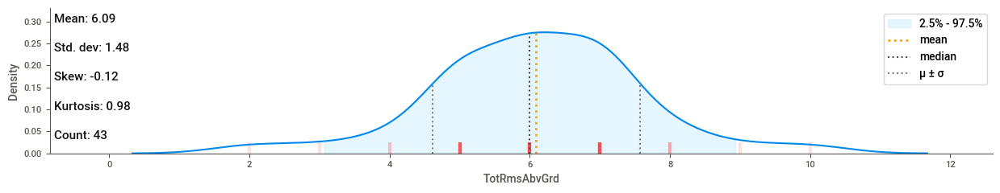

In [24]:
klib.dist_plot(df_raw[40:83])

GridSpec(6, 6)

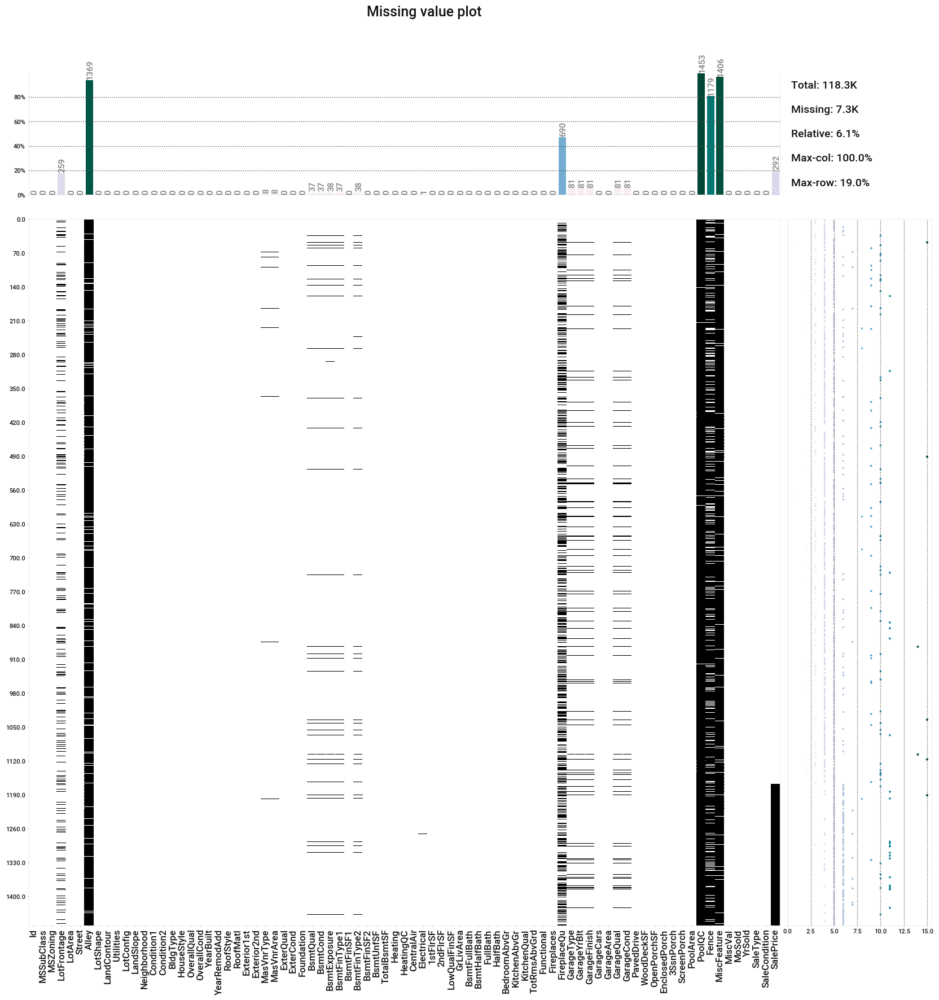

In [25]:
klib.missingval_plot(df_raw)

In [26]:
klib.data_cleaning(df_raw)

Shape of cleaned data: (1460, 78)Remaining NAs: 3029

Changes:
Dropped rows: 0
     of which 0 duplicates. (Rows: [])
Dropped columns: 3
     of which 0 single valued.     Columns: []
Dropped missing values: 4228
Reduced memory by at least: 0.74 MB (-81.32%)



,id,mssub_class,mszoning,lot_frontage,lot_area,street,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition1,condition2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod_add,roof_style,roof_matl,exterior1st,exterior2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmt_fin_type1,bsmt_fin_sf1,bsmt_fin_type2,bsmt_fin_sf2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abv_gr,kitchen_abv_gr,kitchen_qual,tot_rms_abv_grd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,fence,misc_val,mo_sold,yr_sold,sale_type,sale_condition,sale_price
0,127,120,RL,NaN,4928,Pave,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,0,2,2007,WD,Normal,128000.0
1,889,20,RL,95.0,15865,Pave,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,0,10,2007,WD,Normal,268000.0
2,793,60,RL,92.0,9920,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,0,6,2007,WD,Normal,269790.0
3,110,20,RL,105.0,11751,Pave,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,MnPrv,0,1,2010,COD,Normal,190000.0
4,422,20,RL,NaN,16635,Pave,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,0,6,2009,WD,Normal,215000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,83,20,RL,78.0,10206,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,468.0,TA,TA,PConc,Gd,TA,No,GLQ,33,Unf,0,1530,1563,GasA,Ex,Y,SBrkr,1563,0,0,1563,0,0,2,0,3,1,Gd,6,Typ,1,Gd,Attchd,2007.0,RFn,3,758,TA,TA,Y,144,99,0,0,0,0,NaN,0,10,2008,WD,Normal,NaN
1456,1048,20,RL,57.0,9245,Pave,IR2,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,5,5,1994,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,686,Unf,0,304,990,GasA,Ex,Y,SBrkr,990,0,0,990,0,1,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1996.0,Unf,2,672,TA,TA,Y,0,0,0,0,0,0,NaN,0,2,2008,WD,Normal,NaN
1457,17,20,RL,NaN,11241,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,7,1970,1970,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,TA,TA,No,ALQ,578,Unf,0,426,1004,GasA,Ex,Y,SBrkr,1004,0,0,1004,1,0,1,0,2,1,TA,5,Typ,1,TA,Attchd,1970.0,Fin,2,480,TA,TA,Y,0,0,0,0,0,0,NaN,700,3,2010,WD,Normal,NaN
1458,523,50,RM,50.0,5000,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Feedr,Norm,1Fam,1.5Fin,6,7,1947,1950,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,Gd,CBlock,TA,TA,No,ALQ,399,Unf,0,605,1004,GasA,Ex,Y,SBrkr,1004,660,0,1664,0,0,2,0,3,1,TA,7,

In [27]:
df_raw.drop(['Id'], axis = 1, inplace = True)

In [28]:
df_raw['Age'] = df_raw['YrSold'] - df_raw['YearBuilt']

In [29]:
df_raw.drop(['YrSold','YearBuilt'], axis = 1, inplace = True)

In [30]:
# pivot table for the missing values
total = df_raw.isnull().sum().sort_values(ascending=False)
percentage = (df_raw.isnull().sum()/df_raw.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percentage], axis=1, keys=['Total', 'Percentage'])
missing_data.head(20)

,Total,Percentage
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
FireplaceQu,690,0.472603
SalePrice,292,0.200000
LotFrontage,259,0.177397
GarageYrBlt,81,0.055479
GarageFinish,81,0.055479
GarageQual,81,0.055479


In [31]:
df_raw.drop(['PoolQC','MiscFeature','Alley','Fence','FireplaceQu'], axis = 1, inplace = True)

In [32]:
df_raw

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,Age
0,120,RL,NaN,4928,Pave,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,0,2,WD,Normal,128000.0,31
1,20,RL,95.0,15865,Pave,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,0,10,WD,Normal,268000.0,37
2,60,RL,92.0,9920,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,0,6,WD,Normal,269790.0,11
3,20,RL,105.0,11751,Pave,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,0,1,COD,Normal,190000.0,33
4,20,RL,NaN,16635,Pave,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,0,6,WD,Normal,215000.0,32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,20,RL,78.0,10206,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2007,Gable,CompShg,VinylSd,VinylSd,Stone,468.0,TA,TA,PConc,Gd,TA,No,GLQ,33,Unf,0,1530,1563,GasA,Ex,Y,SBrkr,1563,0,0,1563,0,0,2,0,3,1,Gd,6,Typ,1,Attchd,2007.0,RFn,3,758,TA,TA,Y,144,99,0,0,0,0,0,10,WD,Normal,NaN,1
288,20,RL,57.0,9245,Pave,IR2,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,5,5,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,686,Unf,0,304,990,GasA,Ex,Y,SBrkr,990,0,0,990,0,1,1,0,3,1,TA,5,Typ,0,Detchd,1996.0,Unf,2,672,TA,TA,Y,0,0,0,0,0,0,0,2,WD,Normal,NaN,14
289,20,RL,NaN,11241,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,7,1970,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,TA,TA,No,ALQ,578,Unf,0,426,1004,GasA,Ex,Y,SBrkr,1004,0,0,1004,1,0,1,0,2,1,TA,5,Typ,1,Attchd,1970.0,Fin,2,480,TA,TA,Y,0,0,0,0,0,0,700,3,WD,Normal,NaN,40
290,50,RM,50.0,5000,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Feedr,Norm,1Fam,1.5Fin,6,7,1950,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,Gd,CBlock,TA,TA,No,ALQ,399,Unf,0,605,1004,GasA,Ex,Y,SBrkr,1004,660,0,1664,0,0,2,0,3,1,TA,7,Typ,2,Detchd,1950.0,Unf,2,420,TA,TA,Y,0,24,36,0,0,0,0,10,WD,Normal,NaN,59


In [33]:

# we treat categorical and numerical values separately  
cat = []
num = []
for col in df_raw:
    if df_raw[col].dtypes == 'object':
        cat.append(col)
    elif col != 'SalePrice' and col != 'Id':
        num.append(col)
        
df_raw_cat = df_raw[cat]
df_raw_num = df_raw[num]

In [34]:
df_raw_num

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,Age
0,120,NaN,4928,6,5,1976,0.0,120,0,958,1078,958,0,0,958,0,0,2,0,2,1,5,1,1977.0,2,440,0,205,0,0,0,0,0,2,31
1,20,95.0,15865,8,6,1970,0.0,351,823,1043,2217,2217,0,0,2217,1,0,2,0,4,1,8,1,1970.0,2,621,81,207,0,0,224,0,0,10,37
2,60,92.0,9920,7,5,1997,0.0,862,0,255,1117,1127,886,0,2013,1,0,2,1,3,1,8,1,1997.0,2,455,180,130,0,0,0,0,0,6,11
3,20,105.0,11751,6,6,1977,480.0,705,0,1139,1844,1844,0,0,1844,0,0,2,0,3,1,7,1,1977.0,2,546,0,122,0,0,0,0,0,1,33
4,20,NaN,16635,6,7,2000,126.0,1246,0,356,1602,1602,0,0,1602,0,1,2,0,3,1,8,1,1977.0,2,529,240,0,0,0,0,0,0,6,32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,20,78.0,10206,8,5,2007,468.0,33,0,1530,1563,1563,0,0,1563,0,0,2,0,3,1,6,1,2007.0,3,758,144,99,0,0,0,0,0,10,1
288,20,57.0,9245,5,5,1995,0.0,686,0,304,990,990,0,0,990,0,1,1,0,3,1,5,0,1996.0,2,672,0,0,0,0,0,0,0,2,14
289,20,NaN,11241,6,7,1970,180.0,578,0,426,1004,1004,0,0,1004,1,0,1,0,2,1,5,1,1970.0,2,480,0,0,0,0,0,0,700,3,40
290,50,50.0,5000,6,7,1950,0.0,399,0,605,1004,1004,660,0,1664,0,0,2,0,3,1,7,2,1950.0,2,420,0,24,36,0,0,0,0,10,59


In [35]:
# Using Mode to replace missing values for catagorical data such as Electrical System
for i in df_raw:
  if df_raw[i].dtypes == 'object':
    df_raw[i] = df_raw[i].fillna(df_raw[i].mode()[0])
  else:
    df_raw[i] = df_raw[i].fillna(df_raw[i].median())


In [36]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
for col in df_raw.columns:
    if df_raw[col].dtype=="object":
        df_raw[col]=le.fit_transform(df_raw[col])

In [37]:

from scipy.stats import zscore
z_score=abs(zscore(df_raw))
print(df_raw.shape)
df_final=df_raw.loc[(z_score<3).all(axis=1)]
print(df_final.shape)

(1460, 74)
(608, 74)


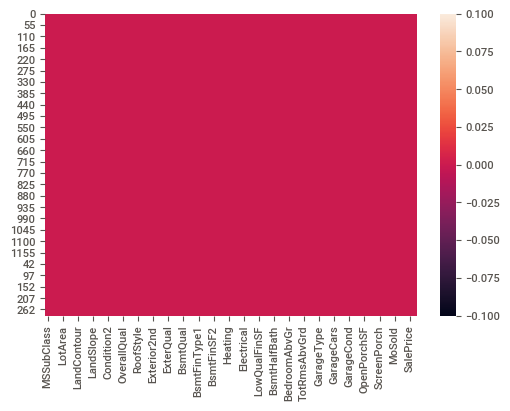

In [38]:
sns.heatmap(df_raw.isnull())

In [39]:

#from dataprep.datasets import load_dataset
#from dataprep.eda import create_report
#create_report(df_raw)

In [40]:
df_x=df_raw.drop(columns='SalePrice')
y=df_raw[['SalePrice']]
print(df_x.shape)
print(y.shape)

(1460, 73)
(1460, 1)


In [41]:

from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt
model = ExtraTreesRegressor()
model.fit(df_x,y)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  """


ExtraTreesRegressor()

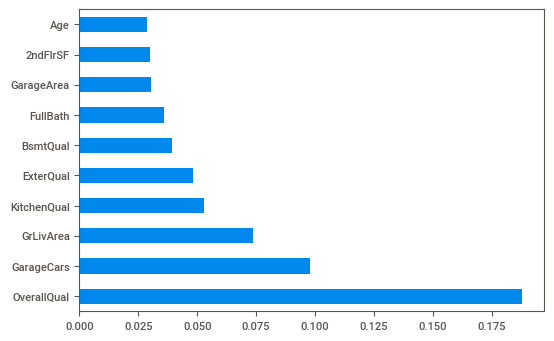

In [42]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=df_x.columns)
feat_importances.nlargest(10).plot(kind='barh')

Text(0, 0.5, 'cumulative explained variance')

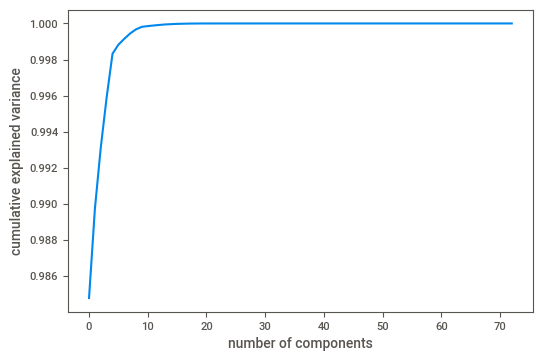

In [43]:
from sklearn.decomposition import PCA
pca = PCA().fit(df_x)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

In [44]:

pca = PCA(n_components =20)
df_x = pca.fit_transform(df_x)

In [45]:
df_x.shape

(1460, 20)

In [46]:
pca_x=pd.DataFrame(df_x)
pca_x

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-5601.710043,-354.043876,144.975882,-641.741162,59.208710,-186.261362,11.542666,44.386291,-69.967163,-58.242903,-130.935398,105.680184,-11.819138,-13.883967,66.564197,4.124268,-6.678449,28.966731,22.575525,-6.280986
1,5382.090209,1360.788021,452.195278,-744.065868,134.711574,665.259778,422.711501,580.552427,-48.634657,-127.083574,-144.924272,11.543063,60.082946,136.177159,7.252957,-28.033832,-2.178750,16.270065,8.699517,-14.141173
2,-584.290008,453.259185,-213.029880,721.911311,-143.631622,-103.707493,170.899782,-48.517541,-125.280384,68.237865,-61.407975,25.287314,-29.521078,-11.023741,-17.520234,-10.562085,3.041211,-21.327760,18.866966,-4.841055
3,1257.814412,1040.032894,534.825268,-572.270329,102.806942,-40.046873,-39.262852,-81.862508,281.822473,-127.096557,-40.054426,41.519390,-19.260829,-21.853557,-25.768414,3.063123,-15.692938,19.888253,18.508037,-2.136748
4,6136.475452,453.701005,904.697015,236.555923,-37.548253,-62.344559,59.895488,-90.988001,-27.915613,114.146863,37.400700,-36.611597,-3.930686,-9.482769,-22.168909,-11.219154,-7.247898,0.490710,-14.004202,12.257785
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,-302.706829,627.700196,56.297823,-1136.059128,154.290892,-84.444704,-314.651579,95.968951,192.582532,26.297471,-26.262386,38.813332,0.651221,-12.212482,-12.081905,10.202125,-3.015670,-11.695779,-3.469434,5.197785
1456,-1279.726709,-456.869136,532.956734,92.120655,-53.325613,-139.586712,-181.353281,68.087865,-184.794637,-92.933291,20.972176,-33.910779,0.477049,-21.507082,-23.804599,5.356902,-2.082721,-21.602200,-17.396070,0.508839
1457,716.052518,-515.343414,410.907799,51.782310,651.474390,-147.930984,-121.663844,13.954016,69.375849,-80.319204,17.049779,-23.104223,0.442975,-20.296298,-34.051196,8.735727,-10.298842,7.087325,-3.380755,-5.023283
1458,-5516.121386,158.011722,-306.720384,147.469611,-60.066161,-100.493593,127.155548,-32.064478,-82.212525,-80.434743,35.171176,-19.610345,-17.676536,-1.750485,-22.007273,-2.909194,-16.354657,34.566457,-17.861583,-22.397509


In [47]:
import numpy as np
for index in pca_x.skew().index:
    if pca_x.skew().loc[index]>0.5:
        pca_x[index]=np.cbrt(pca_x[index])
    if pca_x.skew().loc[index]<-0.5:
        pca_x[index]=np.square(pca_x[index])
print(pca_x.skew())
print("Total count of numeric features: ",len(pca_x.skew()))
print("count of features which are significantly skewed: ",len(pca_x.skew().loc[abs(pca_x.skew())>0.5]))

0     0.778898
1     0.242494
2    -0.011597
3    -0.456677
4     1.364872
5     0.941696
6    -0.056169
7     0.348058
8     0.269808
9     0.382081
10    0.256169
11    0.604577
12    1.396396
13    1.069865
14    1.011201
15    0.328535
16    0.706369
17    0.183014
18    0.299674
19    0.532808
dtype: float64
Total count of numeric features:  20
count of features which are significantly skewed:  9


In [48]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
sc.fit(pca_x)
x=sc.transform(pca_x)
x=pd.DataFrame(x,columns=pca_x.columns)

In [49]:
x

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-1.018805,-0.828844,0.247604,-1.210892,1.367293,-0.860420,0.063779,0.904774,-0.814775,-0.763243,-2.024243,1.622135,-0.473270,-0.514891,1.759116,0.915020,-0.732764,1.196703,1.400857,-0.718406
1,1.509769,1.505114,0.772304,-1.403968,1.663305,2.084404,2.335675,1.975277,-0.711522,-1.027536,-2.240509,0.879127,2.002546,2.178829,1.010108,-1.417925,-0.432429,0.998024,1.046487,-0.996132
2,-0.345192,1.068050,-0.363833,1.362164,-0.833383,-0.653907,0.944300,-0.697766,-1.008592,1.064587,-0.949359,1.082407,-0.798104,-0.451409,-0.593662,-0.993834,0.972648,-0.964779,1.325293,-0.644079
3,1.027474,1.383022,0.913427,-1.079809,1.556903,-0.393499,-0.216945,-0.852670,1.528549,-1.027575,-0.619236,1.241235,-0.634216,-0.654905,-0.719767,0.838934,-1.050322,1.062898,1.317470,-0.448488
4,1.565899,1.068371,1.545131,0.446354,-0.378433,-0.504419,0.330950,-0.887382,-0.576182,1.240073,0.578210,-0.801017,-0.193620,-0.412529,-0.668649,-1.016244,-0.759416,0.352581,-1.010437,1.292845
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,-0.227260,1.181256,0.096151,-2.143614,1.720453,-0.590481,-1.738594,1.136132,1.357036,0.809177,-0.406013,1.218075,0.783575,-0.478989,-0.486594,1.199097,-0.508367,-0.778642,-0.597620,1.014968
1456,-0.524121,-0.909517,0.910236,0.173821,-0.478501,-0.753652,-1.002060,1.025783,-1.160508,-0.913207,0.324227,-0.775803,0.749436,-0.649604,-0.692516,0.988434,-0.422533,-0.969160,-1.093650,0.562455
1457,0.895029,-0.950074,0.701789,0.097707,2.516792,-0.774325,-0.672249,0.652139,0.991428,-0.863859,0.263587,-0.658800,0.741816,-0.630620,-0.821508,1.144144,-0.882477,0.771278,-0.591630,-0.654238
1458,-1.012290,0.775557,-0.523847,0.278258,-0.515203,-0.643906,0.702593,-0.592908,-0.864725,-0.864334,0.543742,-0.613193,-0.603996,-0.087264,-0.666227,-0.608560,-1.068085,1.265628,-1.104199,-1.190242


In [50]:

#to find random stat which gives maximum r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
def maxr2_score(regr,x,y):
    max_r_score=0
    for r_state in range(42,100):
        x_train, x_test, y_train, y_test = train_test_split(x, y,random_state = r_state,test_size=0.20)
        regr.fit(x_train,y_train)
        y_pred = regr.predict(x_test)
        r2_scr=r2_score(y_test,y_pred)
        print("r2 score corresponding to ",r_state," is ",r2_scr)
        if r2_scr>max_r_score:
            max_r_score=r2_scr
            final_r_state=r_state
    print("max r2 score corresponding to ",final_r_state," is ",max_r_score)
    return final_r_state

In [51]:
from sklearn.tree import DecisionTreeRegressor
dtr=DecisionTreeRegressor()
r_state=maxr2_score(dtr,x,y)

r2 score corresponding to  42  is  0.17198976194396087
r2 score corresponding to  43  is  0.05809762105734917
r2 score corresponding to  44  is  0.3658246994022608
r2 score corresponding to  45  is  -0.2634785714954113
r2 score corresponding to  46  is  0.2721391528395525
r2 score corresponding to  47  is  0.23825182542080192
r2 score corresponding to  48  is  0.26159684877567413
r2 score corresponding to  49  is  0.24256873042353644
r2 score corresponding to  50  is  0.2418833950832634
r2 score corresponding to  51  is  0.303104892239207
r2 score corresponding to  52  is  0.22141664009820317
r2 score corresponding to  53  is  0.3047431547037516
r2 score corresponding to  54  is  0.18061792057857662
r2 score corresponding to  55  is  0.37797046227398934
r2 score corresponding to  56  is  0.12088387570574899
r2 score corresponding to  57  is  0.11481336747521587
r2 score corresponding to  58  is  0.03608247561088318
r2 score corresponding to  59  is  -0.22624486942786493
r2 score corres

In [52]:

#Lets chcek random forest
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
import warnings
warnings.filterwarnings("ignore")
rfr=RandomForestRegressor()
parameters = {"n_estimators":[10,100,500]}
clf = GridSearchCV(rfr, parameters, cv=5,scoring="r2")
clf.fit(x,y)
clf.best_params_

{'n_estimators': 100}

In [53]:
#lets chcek Random forest using n_estimators=500
from sklearn.ensemble import RandomForestRegressor
rfr=RandomForestRegressor(n_estimators=500)
#Lets chcek the cross_val_score for Random Forest Regressor
print("Random Forest Regressor\n\n")
r_state=maxr2_score(dtr,x,y)

Random Forest Regressor


r2 score corresponding to  42  is  0.14803741732528997
r2 score corresponding to  43  is  0.047083893763900764
r2 score corresponding to  44  is  0.37777611704478076
r2 score corresponding to  45  is  -0.21147102183810063
r2 score corresponding to  46  is  0.1979968785389422
r2 score corresponding to  47  is  0.2889411640183456
r2 score corresponding to  48  is  0.32397053870166337
r2 score corresponding to  49  is  0.17451685504221337
r2 score corresponding to  50  is  0.22670089042411834
r2 score corresponding to  51  is  0.26403394455460516
r2 score corresponding to  52  is  0.2735057785154005
r2 score corresponding to  53  is  0.21917273868706777
r2 score corresponding to  54  is  0.2207902197335485
r2 score corresponding to  55  is  0.2680218009729236
r2 score corresponding to  56  is  0.10069045262960674
r2 score corresponding to  57  is  0.16783983757859788
r2 score corresponding to  58  is  0.027614933956896848
r2 score corresponding to  59  is  -0.170

In [54]:
#Lets chcek KNN regressor
from sklearn.neighbors import KNeighborsRegressor
knr=KNeighborsRegressor()
parameters = {"n_neighbors":range(2,30)}
clf = GridSearchCV(knr, parameters, cv=5,scoring="r2")
clf.fit(x, y)
clf.best_params_

{'n_neighbors': 11}

In [55]:
knr=KNeighborsRegressor(n_neighbors=11)
maxr2_score(knr,x,y)

r2 score corresponding to  42  is  0.3863910636340172
r2 score corresponding to  43  is  0.5415598807075834
r2 score corresponding to  44  is  0.3932494505553944
r2 score corresponding to  45  is  0.4446883518235667
r2 score corresponding to  46  is  0.36612030080643343
r2 score corresponding to  47  is  0.3955247737038191
r2 score corresponding to  48  is  0.4887627415098035
r2 score corresponding to  49  is  0.4562547971164147
r2 score corresponding to  50  is  0.5033571874612914
r2 score corresponding to  51  is  0.5208865996458901
r2 score corresponding to  52  is  0.42485019052907924
r2 score corresponding to  53  is  0.44742045363693395
r2 score corresponding to  54  is  0.5280973511077326
r2 score corresponding to  55  is  0.43086784931653965
r2 score corresponding to  56  is  0.44120954842794935
r2 score corresponding to  57  is  0.4376398505895255
r2 score corresponding to  58  is  0.48073277055443964
r2 score corresponding to  59  is  0.48339761122351665
r2 score correspondin

97

In [56]:

#lets chcek the SVM
from sklearn.svm import SVR
svr=SVR()
parameters={"kernel":["linear", "poly", "rbf"],"C":[0.001,0.01,0.1,1,10]}
clf = GridSearchCV(svr, parameters, cv=5,scoring="r2")
clf.fit(x,y)
clf.best_params_

{'C': 10, 'kernel': 'linear'}

In [57]:
svr=SVR(C=10,kernel="linear")
maxr2_score(svr,x,y)

r2 score corresponding to  42  is  0.07189262977776645
r2 score corresponding to  43  is  0.11470794174442012
r2 score corresponding to  44  is  0.07964025326657798
r2 score corresponding to  45  is  0.12867318056621924
r2 score corresponding to  46  is  0.11935122560045297
r2 score corresponding to  47  is  0.05153579616237247
r2 score corresponding to  48  is  0.13541437518470179
r2 score corresponding to  49  is  0.08802223084032612
r2 score corresponding to  50  is  0.10935757756811659
r2 score corresponding to  51  is  0.12031092508897823
r2 score corresponding to  52  is  0.10030925490533504
r2 score corresponding to  53  is  0.09113915490397229
r2 score corresponding to  54  is  0.1282034787383426
r2 score corresponding to  55  is  0.12379069317661118
r2 score corresponding to  56  is  0.15308644991613574
r2 score corresponding to  57  is  0.07257612050538564
r2 score corresponding to  58  is  0.10625578843339367
r2 score corresponding to  59  is  0.07531730100915068
r2 score co

96

In [61]:
from lazypredict.Supervised import LazyRegressor

In [63]:
reg=LazyRegressor(verbose=0,ignore_warnings=False, custom_metric=None)
model,predictions=reg.fit(x_train,x_test,y_train,y_test)
model.head(10)

100%|██████████| 42/42 [00:08<00:00,  4.75it/s]


,Adjusted R-Squared,R-Squared,RMSE,Time Taken
Model,,,,
RandomForestRegressor,0.57,0.60,48380.16,1.59
HistGradientBoostingRegressor,0.53,0.56,50345.39,0.71
BaggingRegressor,0.53,0.56,50488.80,0.18
LGBMRegressor,0.51,0.55,51192.35,0.34
ExtraTreesRegressor,0.51,0.54,51479.83,0.68
GradientBoostingRegressor,0.50,0.53,51894.99,0.81
AdaBoostRegressor,0.47,0.51,53387.25,0.29
OrthogonalMatchingPursuitCV,0.44,0.47,55140.07,0.04
PoissonRegressor,0.44,0.47,55149.41,0.03


In [58]:
#random forest and KNN are peforming almost equally good,but KNN is faster so we will choose KNN as our Final model
#knr is model
x_train, x_test, y_train, y_test = train_test_split(x, y,random_state = 77,test_size=0.20)
knr.fit(x_train,y_train)
y_pred=knr.predict(x_test)

In [59]:
print("RMSE is: ",np.sqrt(mean_squared_error(y_test,y_pred)))
print("r2_score is: ",r2_score(y_test,y_pred))

RMSE is:  56424.03777755245
r2_score is:  0.44953122353872144


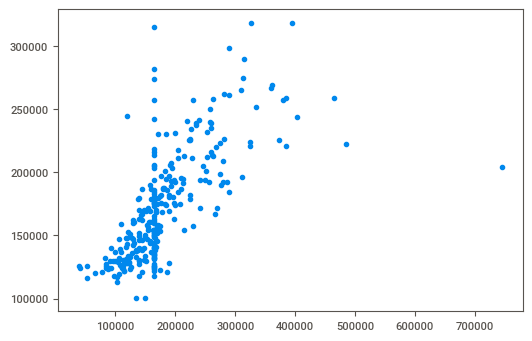

In [60]:
plt.scatter(y_test,y_pred)

In [64]:

#Lets save the model using joblib and pickle
import joblib
import pickle
joblib.dump(knr, 'rf_house_pred.obj')
pickle.dump(knr,open('rf_house_pred.pkl','wb'))